# **Aprendizaje Automático 2 - Trabajo Practico 1**

**Integrantes:**
* Francisca Herrera
* Francisco Rodríguez y Barros
* Ezequiel Zahradnicek

# Librerias y datos

In [1]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input
from tensorflow.keras.layers import Flatten, BatchNormalization, Dropout, GlobalMaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.layers import Input, Concatenate, Flatten, BatchNormalization, Add, Activation, GlobalAveragePooling2D
from keras.layers import Dense, Conv2D, MaxPooling2D, Rescaling, RandomFlip, RandomTranslation, RandomContrast
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
import os

REPO_NAME = "AA-II-RodriguezyBarros-Herrera-Zahradnicek"
if REPO_NAME not in os.getcwd():
  if not os.path.exists(REPO_NAME):
    !git clone https://github.com/franciscoryb1/AA-II-RodriguezyBarros-Herrera-Zahradnicek
  os.chdir(REPO_NAME)

Cloning into 'AA-II-RodriguezyBarros-Herrera-Zahradnicek'...
remote: Enumerating objects: 24323, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 24323 (delta 2), reused 10 (delta 1), pack-reused 24312 (from 2)
Receiving objects: 100% (24323/24323), 349.07 MiB | 32.97 MiB/s, done.
Resolving deltas: 100% (2/2), done.
Updating files: 100% (24337/24337), done.


In [3]:
# Configurar para que TensorFlow utilice la GPU por defecto
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Configurar para que TensorFlow asigne memoria dinámicamente
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Especificar la GPU por defecto
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Manejar error
        print(e)

1 Physical GPUs, 1 Logical GPUs


# Problema 1

## Descripción:
En este problema, se presenta un conjunto de datos que contiene información sobre el rendimiento académico de estudiantes universitarios, así como diversos factores que podrían influir en él. El objetivo es construir un modelo de regresión utilizando redes neuronales para predecir el índice de rendimiento académico de los estudiantes basado en las características proporcionadas.

Dataset:
https://drive.google.com/file/d/1mfpXVLqDJah-sO0CF29LjKUz5NtKjZqc/view?usp=drive_link

El dataset proporcionado incluye las siguientes variables para cada estudiante:
Hours Studied: El número total de horas dedicadas al estudio por cada estudiante.

* Previous Scores: Las puntuaciones obtenidas por los estudiantes en exámenes previos.
* Extracurricular Activities: Si el estudiante participa en actividades extracurriculares (Sí o No).
* Sleep Hours: El número promedio de horas de sueño que el estudiante tuvo por día.
* Sample Question Papers Practiced: El número de cuestionarios de muestra que el estudiante practicó.
Además, el dataset incluye la variable objetivo:
* Performance Index: Un índice que representa el rendimiento académico general de cada estudiante, redondeado al entero más cercano. Este índice varía de 10 a 100, donde valores más altos indican un mejor rendimiento.


Objetivo:
Utilizando el dataset proporcionado, el objetivo es construir un modelo de regresión utilizando redes neuronales que pueda predecir con precisión el índice de rendimiento académico de los estudiantes. Se debe entrenar y evaluar el modelo utilizando técnicas adecuadas de validación y métricas de evaluación de regresión.

## Entrega:
La entrega debe incluir:

* Código fuente de la solución implementada en Google Colab, que incluya:
Análisis previo y preprocesamiento del set de datos.
* Definición y entrenamiento del modelo.
* Resultados de la evaluación del modelo, incluyendo métricas de desempeño y visualizaciones relevantes.

Nota: el código debe estar debidamente documentado con comentarios explicativos para que el trabajo sea fácilmente comprensible para otros revisores.


In [ ]:
df = pd.read_csv('Student_Performance.csv')
df.head()

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
0,7,99,Yes,9,1,91.0
1,4,82,No,4,2,65.0
2,8,51,Yes,7,2,45.0
3,5,52,Yes,5,2,36.0
4,7,75,No,8,5,66.0


# Problema 3
## Descripción:
En este problema, se proporciona un conjunto de datos que contiene imágenes de escenas naturales de todo el mundo. El objetivo es construir un modelo de clasificación utilizando redes neuronales convolucionales (CNN) para clasificar estas imágenes en una de las seis categorías predefinidas.

Dataset:
https://drive.google.com/file/d/1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ/view?usp=drive_link

El dataset proporcionado contiene alrededor de 25,000 imágenes de tamaño 150x150, distribuidas en seis categorías:

* **buildings**
* **forest**
* **glacier**
* **mountain**
* **sea**
* **street**

Las imágenes están divididas en tres conjuntos:

* **Train**: Alrededor de 14,000 imágenes para entrenamiento.
* **Test**: Alrededor de 3,000 imágenes para evaluación del modelo.
* **Prediction**: Alrededor de 7,000 imágenes para predicción final.

## Objetivo:
Utilizando el dataset proporcionado, el objetivo es construir y comparar el rendimiento de distintos modelos de clasificación de imágenes utilizando redes neuronales convolucionales y densas que puedan clasificar con precisión las imágenes de escenas naturales en una de las seis categorías mencionadas anteriormente.
Los modelos a diseñar son:

* Modelo con capas densas.
* Modelo con capas convolucionales y densas.
* Modelo que incluya bloques residuales identidad
* Modelo que utilice como backbone alguna de las arquitecturas disponibles en TensorFlow (transfer learning): https://www.tensorflow.org/api_docs/python/tf/keras/applications

Se debe entrenar y evaluar cada modelo utilizando técnicas adecuadas de validación y métricas de evaluación de clasificación.

## Entrega:
La entrega debe incluir:

* Código fuente de la solución implementada en Google Colab, que incluya:
* Análisis previo y preprocesamiento del set de datos.
* Definición y entrenamiento del modelo.
* Resultados de la evaluación del modelo, incluyendo métricas de desempeño y visualizaciones relevantes.

Nota: el código debe estar debidamente documentado con comentarios explicativos para que el trabajo sea fácilmente comprensible para otros revisores.


## Dataset

In [4]:
# Directorios de los datos
TRAIN_DIRECTORY = Path('train/seg_train')
TEST_DIRECTORY = Path('test/seg_test')
PREDICTION_DIRECTORY = Path('pred/seg_pred')

# Tamaño del lote (batch size)
BATCH_SIZE = 64

# Tamaño de las imágenes
IMAGE_HEIGHT = 128
IMAGE_WIDTH = 128

# Carga los datos de train, test y prediction
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIRECTORY,
    label_mode="categorical",
    seed=42,
    shuffle=True,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(
    TEST_DIRECTORY,
    label_mode="categorical",
    seed=42,
    shuffle=True,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

prediction_ds = tf.keras.utils.image_dataset_from_directory(
    PREDICTION_DIRECTORY,
    label_mode=None,
    seed=42,
    shuffle=True,
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

Found 14034 files belonging to 6 classes.
Found 3000 files belonging to 6 classes.
Found 7301 files.


Se construye el dataset de imágenes usando image_dataset_from_directory.
En cuanto a la resolución, se adoptaron dos enfoques según el tipo de modelo utilizado.

Para el modelo denso, se empleó una resolución de 28×28 píxeles, siguiendo el criterio de que, mientras el ojo humano sea capaz de distinguir entre clases, es posible reducir la resolución sin comprometer el aprendizaje.

Para los modelos basados en arquitecturas convolucionales y transfer learning, se utilizó una resolución de 128×128 píxeles. Esta elección busca preservar mayor información espacial.

In [5]:
# Obtiene los nombres de las clases
class_names = train_ds.class_names
num_classes = len(class_names)
print(class_names)

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


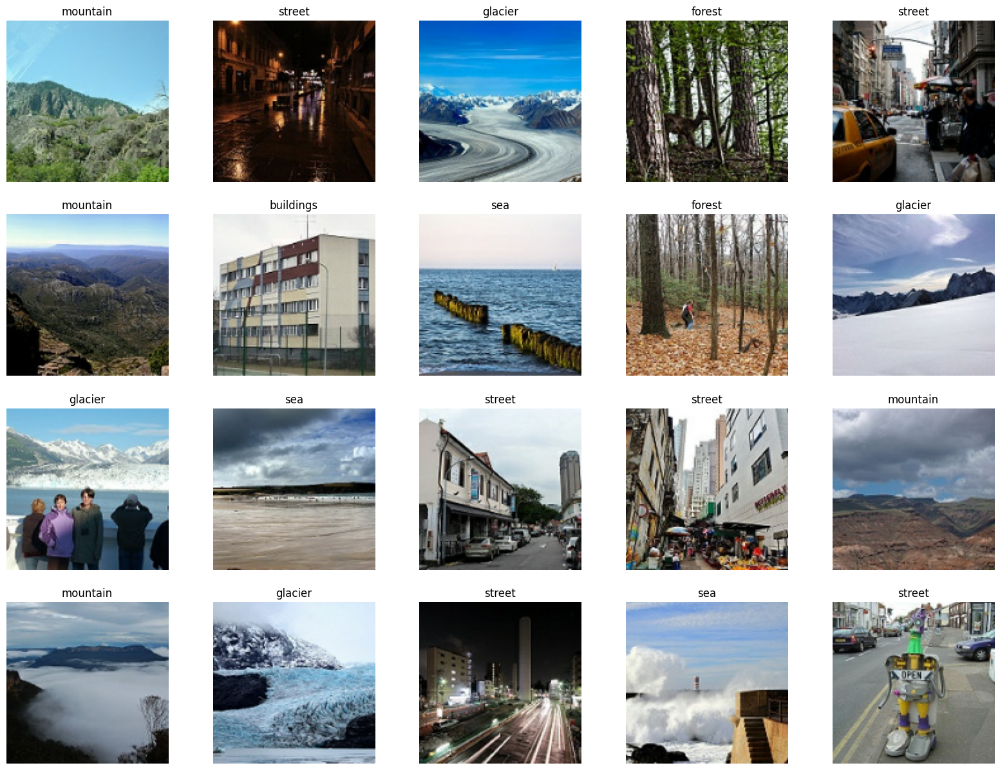

In [6]:
# Muestra algunas imágenes de ejemplo
plt.figure(figsize=(20, 15))
for images, labels in train_ds.take(1):
  for i in range(20):
    ax = plt.subplot(4, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    class_idx = list(labels[i]).index(1)
    plt.title(class_names[class_idx])
    plt.axis("off")

Al observar las imágenes del conjunto de datos, se puede apreciar que ciertas clases presentan diferencias notorias que facilitan su clasificación, como por ejemplo Buildings y Forest. Sin embargo, también existen clases cuya distinción resulta más compleja debido a similitudes visuales, como sucede entre Buildings y Street, o entre Mountain y Glacier.

Particularmente, en este último caso, se detectó que algunas imágenes de montañas nevadas han sido etiquetadas como glaciares. No se sabe con certeza si esto se debe a un error de etiquetado o a una decisión basada en algún criterio específico. Esta situación puede inducir al modelo a aprender que la presencia de nieve implica la pertenencia a la clase Glacier, dificultando la correcta clasificación de montañas nevadas.

Por lo que, si bien algunas clases pueden distinguirse con relativa facilidad, otras requieren atención a detalles visuales más sutiles.

In [7]:
#Normalizacion (Solo para el modelo denso, el convulucional ya lo tiene integrado)
dense = False
if dense:
  train_ds.map(lambda x, y: (x / 255.0, y))
  test_ds.map(lambda x, y: (x / 255.0, y))

Para los modelos convolucionales y aquellos basados en Transfer Learning, el preprocesamiento de las imágenes se realiza mediante funciones específicas integradas. En los modelos convolucionales entrenados desde cero se emplea la capa Rescaling.

En el caso de Transfer Learning, se utiliza una función de preprocesamiento propia del modelo base seleccionado, como preprocess_input, que ajusta los valores de entrada de acuerdo con el modelo preentrenado.

En cambio, para el modelo denso, el preprocesamiento aplicado consiste únicamente en normalizar los valores de intensidad de los píxeles al rango [0, 1].

In [8]:
train_ds = train_ds.shuffle(buffer_size=7000, seed=42).prefetch(buffer_size=tf.data.AUTOTUNE)

## Modelo con capas densas.

In [ ]:
# Definimos el modelo.
model = Sequential([
    Flatten(input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)),

    Dense(186),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.5),

    Dense(64),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.5),

    Dense(64),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.3),

    Dense(32),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.3),

    Dense(16),
    BatchNormalization(),
    Activation('relu'),

    Dense(num_classes, activation='softmax')
])

In [ ]:
model.summary()
num_params = model.count_params()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)             │ (None, 3072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 186)            │       571,578 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 186)            │           744 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 186)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 186)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │        11,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 6)              │           102 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 591,864 (2.26 MB)

 Trainable params: 591,140 (2.26 MB)

 Non-trainable params: 724 (2.83 KB)

In [ ]:
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "best_dense_model.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.58,
    mode="max",
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss", factor=0.5, patience=4, verbose=0, min_delta=1e-4, mode="min", min_lr=3.1250e-05)

model.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])

# Número de épocas de entrenamiento
EPOCHS = 50
# Entrena el modelo
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping, reduce_lr]
)

Epoch 1/150
220/220 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - accuracy: 0.2220 - loss: 1.8292 - val_accuracy: 0.4257 - val_loss: 1.4359 - learning_rate: 0.0010
Epoch 2/150
220/220 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - accuracy: 0.4144 - loss: 1.4960 - val_accuracy: 0.4827 - val_loss: 1.3486 - learning_rate: 0.0010
Epoch 3/150
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.4669 - loss: 1.3746 - val_accuracy: 0.5153 - val_loss: 1.2572 - learning_rate: 0.0010
Epoch 4/150
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.4882 - loss: 1.3228 - val_accuracy: 0.5263 - val_loss: 1.2052 - learning_rate: 0.0010
Epoch 5/150
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.5119 - loss: 1.2776 - val_accuracy: 0.5317 - val_loss: 1.2092 - learning_rate: 0.0010
Epoch 6/150
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.5313 - loss: 1.2345 - val_accuracy: 0.5320 - val_loss: 1.1998 - learning_rate: 0.0010
Epoch 7/150
220/220 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.5369 - loss

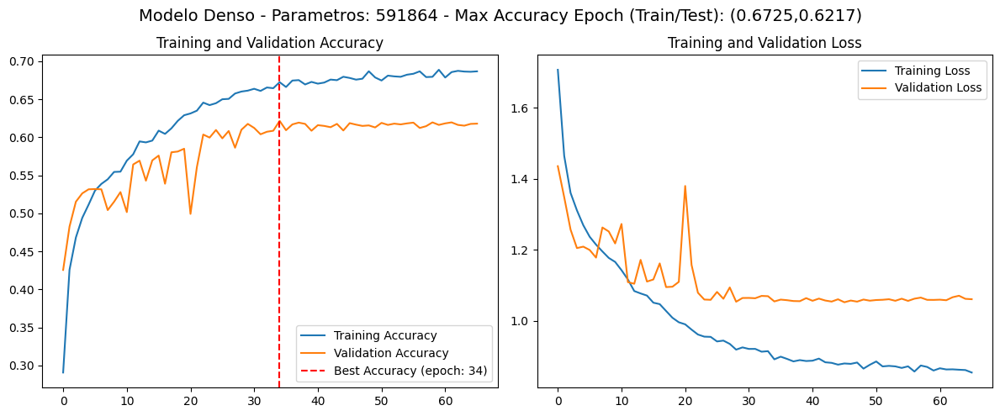

In [ ]:
# Grafica la precisión y pérdida de entrenamiento y validación
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.epoch))
best_acc_epoch = np.argmax(val_acc)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Subplot 1 - Accuracy
axs[0].plot(epochs_range, acc, label='Training Accuracy')
axs[0].plot(epochs_range, val_acc, label='Validation Accuracy')
axs[0].axvline(best_acc_epoch, color='red', linestyle='--', label=f'Best Accuracy (epoch: {np.argmax(val_acc)})')
axs[0].legend(loc='lower right')
axs[0].set_title('Training and Validation Accuracy')

# Subplot 2 - Loss
axs[1].plot(epochs_range, loss, label='Training Loss')
axs[1].plot(epochs_range, val_loss, label='Validation Loss')
axs[1].legend(loc='upper right')
axs[1].set_title('Training and Validation Loss')

# Título general opcional
fig.suptitle(f'Modelo Denso - Parametros: {num_params} - Max Accuracy Epoch (Train/Test): ({acc[np.argmax(val_acc)]:.4f},{max(val_acc):.4f})', fontsize=14)

plt.tight_layout()
plt.subplots_adjust(top=0.87)
plt.show()

Para la construcción del modelo denso, se evaluaron aproximadamente ocho modelos distintos, variando los paramentros entre 400 mil - 1,5M. En general, se observó que el modelo no podía superar en validación un umbral de accuracy de 0.64.

El modelo de 800 mil parámetros presentó una clara tendencia al overfitting, con una accuracy de 0.76 en train y 0.64 en validation. Por el contrario, el modelo de 400 mil parámetros evidenció underfitting, con valores de 0.70 en train y 0.61 en validation.

Se optó por un punto intermedio entre ambos, seleccionando un modelo de 600 mil parámetros que alcanzó 0,67 de accuracy en train y 0,62 en validation, lo que representa una brecha del 5% entre ambos conjuntos..

El objetivo fue conseguir una brecha entre train y validation situada entre el 5% y el 7%, de modo que el modelo mantenga buena generalización sin incurrir en overfitting. Aunque el modelo de 800 mil parámetros alcanzó 0,64 de accuracy en validation, su diferencia del 12% respecto a train indica que empezó a memorizar en lugar de aprender.

Por eso el modelo intermedio de 600 mil parámetros, con un 5% de brecha, se considera más robusto y con mayor capacidad de generalización.

In [ ]:
best_model = load_model('models/best_dense_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


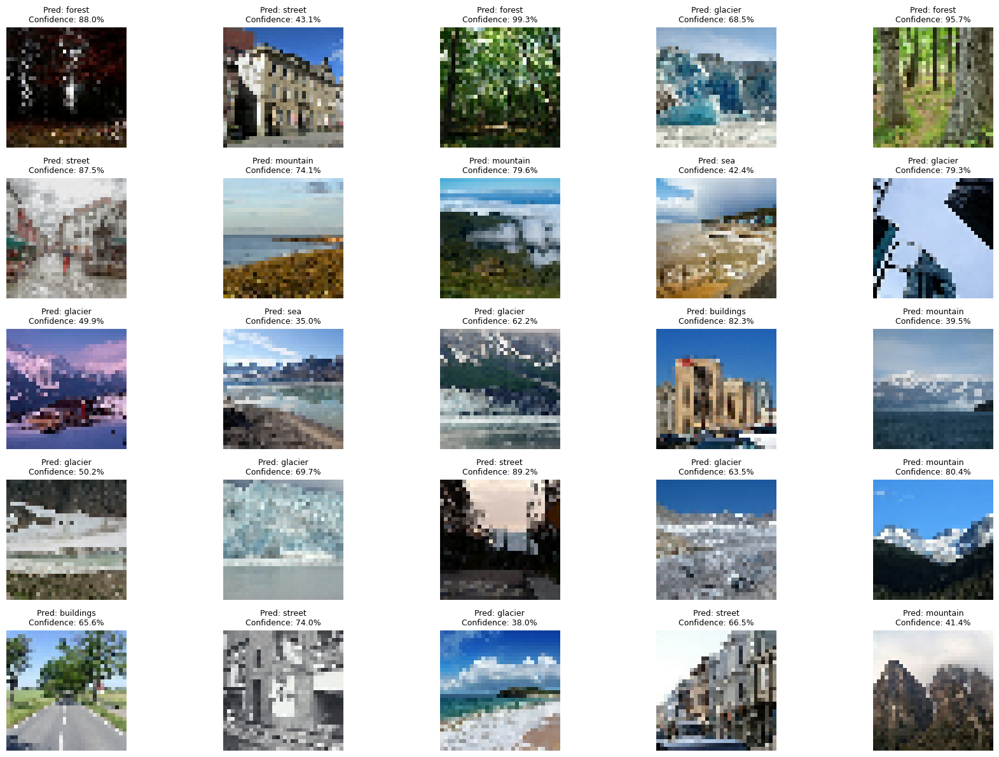

In [ ]:
for images in prediction_ds.take(1):
  prediction_images = images[:25]
  true_labels = images[:25]
  break

predictions = best_model.predict(prediction_images)

# Crear subplots
fig, axes = plt.subplots(5, 5, figsize=(18, 12))

for idx, ax in enumerate(axes.flat):
    img = prediction_images[idx].numpy().astype("uint8")
    pred_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img)
    ax.set_title(f"Pred: {pred_class}\nConfidence: {confidence:.1f}%", fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()

Si bien el modelo logró predecir correctamente algunas clases, por ejemplo la clase forest con un alto nivel de confianza, se observaron limitaciones claras cuando se trataron imágenes con características visuales similares entre distintas clases.

El modelo tiende a asociar la clase con ciertas intensidades de color o combinaciones específicas de valores en los píxeles. Esto se hace evidente en casos como buildings y street, donde la similitud en los niveles de intensidad de píxeles entre ambas clases provoca confusión frecuente. Lo mismo ocurre entre clases como mountain y glacier, donde la presencia de zonas blancas intensas lleva al modelo a confundir una clase con la otra.

Esto sugiere que el modelo está actuando más como un clasificador de “tonalidades promedio” para la predicción de cada clase.

## Modelo con capas convolucionales y densas.

In [ ]:
def build_model(input_shape, output_labels):
    i = Input(input_shape, dtype=tf.float32)

    x = Rescaling(1./255)(i)
    x = RandomFlip("horizontal")(x)
    x = RandomFlip("vertical")(x)
    x = RandomTranslation(0.1, 0.1, fill_mode="reflect")(x)
    x = RandomContrast(0.2)(x)

    # Bloque 1
    x = Conv2D(16, (3, 3), padding='same')(x)
    x = Activation('relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 2
    x = Conv2D(32, (3, 3), padding='same')(x)
    x = Activation('relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 3
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = Activation('relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = Flatten()(x)
    x = Dense(64)(x)
    x = Activation('relu')(x)
    x = Dropout(0.25)(x)
    x = Dense(output_labels)(x)
    x = Activation('softmax')(x)

    return tf.keras.Model(inputs=i, outputs=x)

Como punto de partida, se tomó como inspiración la arquitectura VGG, y se diseñó un modelo con aproximadamente 5 millones de parámetros.

La estructura inicial incluyó bloques compuestos por dos capas convolucionales con filtros de tamaño 3×3, con el objetivo de emular el efecto de un filtro 5×5. Se aplicó la heurística habitual de duplicar progresivamente la cantidad de filtros en cada bloque: comenzando con 32, luego 64 y finalmente 128. Este diseño se implementó sobre imágenes de resolución 150×150, lo que inevitablemente derivó en un modelo demasiado complejo para el problema planteado.

Por este motivo, se redujo la resolución de entrada a 128×128 píxeles y se eliminó uno de los filtros 3×3 en cada bloque, manteniendo solo una capa convolucional por bloque. También se redujo la cantidad de kernels por capa convolucional. Con estos ajustes, se logró reducir la cantidad de parámetros a aproximadamente 2,7 millones.

A partir de esta versión intermedia, se continuaron probando variantes del modelo con menor complejidad, buscando obtener el mismo o un mejor rendimiento.


In [ ]:
model = build_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)
model.summary()
num_params = model.count_params()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_1 (RandomFlip)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation              │ (None, 128, 128, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ (None, 128, 128, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     1,048,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,073,062 (4.09 MB)

 Trainable params: 1,072,838 (4.09 MB)

 Non-trainable params: 224 (896.00 B)

In [ ]:
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "best_conv_model.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.6,
    mode="max",
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss", factor=0.5, patience=4, verbose=0, min_delta=1e-4, mode="min", min_lr=1e-6)

model.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])


start_time = time.time()

# Número de épocas de entrenamiento
EPOCHS = 70
# Entrena el modelo
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping, reduce_lr]
)

end_time = time.time()
training_time = end_time - start_time

Epoch 1/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - accuracy: 0.3884 - loss: 1.9117 - val_accuracy: 0.2327 - val_loss: 13.4490 - learning_rate: 0.0010
Epoch 2/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step - accuracy: 0.5432 - loss: 1.1658 - val_accuracy: 0.4117 - val_loss: 1.6853 - learning_rate: 0.0010
Epoch 3/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step - accuracy: 0.5976 - loss: 1.0227 - val_accuracy: 0.6050 - val_loss: 1.1688 - learning_rate: 0.0010
Epoch 4/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - accuracy: 0.6336 - loss: 0.9393 - val_accuracy: 0.7137 - val_loss: 0.8238 - learning_rate: 0.0010
Epoch 5/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step - accuracy: 0.6610 - loss: 0.8756 - val_accuracy: 0.7173 - val_loss: 0.7804 - learning_rate: 0.0010
Epoch 6/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - accuracy: 0.6755 - loss: 0.8229 - val_accuracy: 0.7143 - val_loss: 0.7981 - learning_rate: 0.0010
Epoch 7/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step - accuracy: 0.7015 - 

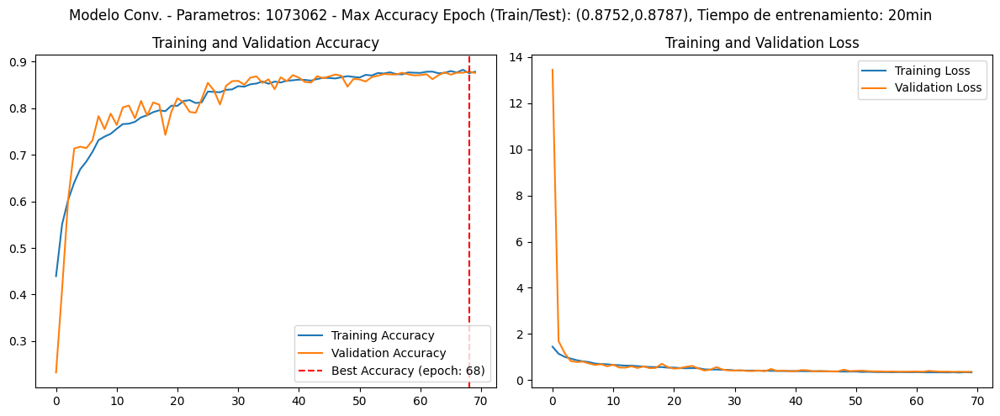

In [ ]:
# Grafica la precisión y pérdida de entrenamiento y validación
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.epoch))
best_acc_epoch = np.argmax(val_acc)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Subplot 1 - Accuracy
axs[0].plot(epochs_range, acc, label='Training Accuracy')
axs[0].plot(epochs_range, val_acc, label='Validation Accuracy')
axs[0].axvline(best_acc_epoch, color='red', linestyle='--', label=f'Best Accuracy (epoch: {np.argmax(val_acc)})')
axs[0].legend(loc='lower right')
axs[0].set_title('Training and Validation Accuracy')

# Subplot 2 - Loss
axs[1].plot(epochs_range, loss, label='Training Loss')
axs[1].plot(epochs_range, val_loss, label='Validation Loss')
axs[1].legend(loc='upper right')
axs[1].set_title('Training and Validation Loss')

# Título general opcional
fig.suptitle(f'Modelo Conv. - Parametros: {num_params} - Max Accuracy Epoch (Train/Test): ({acc[np.argmax(val_acc)]:.4f},{max(val_acc):.4f}), Tiempo de entrenamiento: {training_time/ 60:.0f}min', fontsize=12)

plt.tight_layout()
plt.subplots_adjust(top=0.87)
plt.show()

Durante el proceso de ajuste de la arquitectura convolucional, se compararon modelos con distintas cantidades de parámetros: uno de 2,7 millones, otro de 1,6 millones, uno de 1 millón y, finalmente, uno de 500 mil.

Todos, salvo el último, obtuvieron resultados muy similares en validación, con una métrica promedio en torno a 0,87.

Este comportamiento sugiere que, aunque se redujo la complejidad del modelo, no hubo una pérdida significativa en la capacidad predictiva. De hecho, el modelo con 1 millón de parámetros obtuvo una métrica ligeramente superior a la del modelo de 2,7 millones.

A pesar de la reducción de parámetros, el modelo con 1 millón de parámetros demostró ser más eficiente, ya que logró un rendimiento ligeramente mejor con la mitad de la complejidad.

En cambio, al reducir la complejidad por debajo de este umbral, con el modelo de 500 mil parámetros, se observó una caída más marcada en la métrica (0,85), lo que indica que, a partir de ese punto, la capacidad de representación del modelo comienza a verse comprometida.

In [ ]:
best_conv_model = load_model('models/best_conv_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


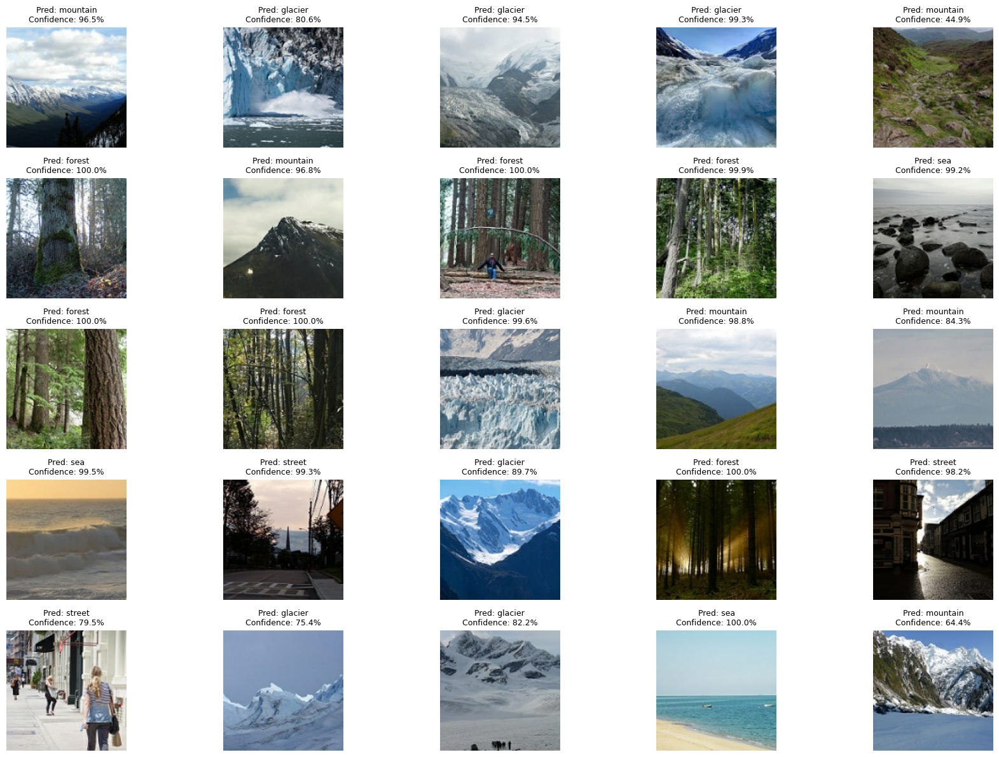

In [ ]:
for images in prediction_ds.take(1):
  prediction_images = images[:25]
  true_labels = images[:25]
  break

predictions = best_conv_model.predict(prediction_images)

# Crear subplots
fig, axes = plt.subplots(5, 5, figsize=(18, 12))

for idx, ax in enumerate(axes.flat):
    img = prediction_images[idx].numpy().astype("uint8")
    pred_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img)
    ax.set_title(f"Pred: {pred_class}\nConfidence: {confidence:.1f}%", fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()

En los resultados obtenidos por la predicción del modelo, ya se observa que las clases más distintivas, como forest, que son fácilmente diferenciables de las demás, se predicen con una confianza cercana al 100%.

Estas clases son detectadas con alta precisión. Sin embargo, las clases que presentan mayor dificultad para ser diferenciadas, como mountain y glacier, aún muestran algunas confusiones. En algunos casos, montañas nevadas han sido clasificadas como glaciares, lo que podría deberse a un error en el etiquetado del dataset o a una dificultad inherente del modelo para distinguir entre estas dos clases.

A pesar de esto, el modelo muestra una clara mejora con respecto al modelo denso, aumentando tanto su confianza como su capacidad para predecir correctamente entre clases.

## Modelo con bloques residuales

In [ ]:
def build_residual_model(input_shape, output_labels):
    i = Input(input_shape, dtype=tf.float32)

    x = Rescaling(1./255)(i)
    x = RandomFlip("horizontal")(x)
    x = RandomFlip("vertical")(x)
    x = RandomTranslation(0.1, 0.1, fill_mode="reflect")(x)
    x = RandomContrast(0.2)(x)

    # Bloque residual
    shortcut = BatchNormalization()(x)
    shortcut = Activation('relu')(shortcut)
    shortcut = Conv2D(64, (1,1), strides=8, padding='same')(shortcut)
    shortcut = BatchNormalization()(shortcut)

    # Bloque 1
    x = Conv2D(16, (3, 3), padding='same')(x)
    x = Activation('relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 2
    x = Conv2D(32, (3, 3), padding='same')(x)
    x = Activation('relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Bloque 3
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = Activation('relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Suma del bloque residual
    x = Add()([x, shortcut])

    x = Flatten()(x)
    x = Dense(64)(x)
    x = Activation('relu')(x)
    x = Dropout(0.25)(x)
    x = Dense(output_labels)(x)
    x = Activation('softmax')(x)

    return tf.keras.Model(inputs=i, outputs=x)

Para el modelo con bloques residuales se utilizó exactamente la misma arquitectura del modelo convolucional anterior.

Si bien las conexiones residuales muestran sus ventajas en redes de gran profundidad, donde suele presentarse el problema de desvanecimiento del gradiente, entrenar un modelo tan extenso (En Colab) para este tipo de problema no parecía viable.

Por ello, y con el objetivo de mantener una comparación directa, se aplicó el bloque residual al modelo previamente diseñado. Este enfoque busca observar de forma clara los efectos que induce la incorporación del bloque residual sobre la arquitectura existente.

In [ ]:
model = build_residual_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)
model.summary()
num_params = model.count_params()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 128, 128,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_flip_2       │ (None, 128, 128,  │          0 │ rescaling_1[0][0] │
│ (RandomFlip)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_flip_3       │ (None, 128, 128,  │          0 │ random_flip_2[0]… │
│ (RandomFlip)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_translation… │ (None, 128, 128,  │          0 │ random_flip_3[0]… │
│ (RandomTranslation) │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast_1   │ (None, 128, 128,  │          0 │ random_translati… │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │        448 │ random_contrast_… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_7        │ (None, 128, 128,  │          0 │ conv2d_5[0][0]    │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │         64 │ activation_7[0][… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │      4,640 │ max_pooling2d_3[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_8        │ (None, 64, 64,    │          0 │ conv2d_6[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        128 │ activation_8[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │     18,496 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │         12 │ random_contrast_… │
│ (BatchNormalizatio… │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_9        │ (None, 32, 32,    │          0 │ conv2d_7[0][0]  

 Total params: 1,073,586 (4.10 MB)

 Trainable params: 1,073,228 (4.09 MB)

 Non-trainable params: 358 (1.40 KB)

In [ ]:
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "best_residual_model.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.6,
    mode="max",
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss", factor=0.5, patience=4, verbose=0, min_delta=1e-4, mode="min", min_lr=1e-6)

model.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])


start_time = time.time()

# Número de épocas de entrenamiento
EPOCHS = 70
# Entrena el modelo
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping, reduce_lr]
)

end_time = time.time()
training_time = end_time - start_time

Epoch 1/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step - accuracy: 0.4316 - loss: 1.9230 - val_accuracy: 0.1967 - val_loss: 10.5777 - learning_rate: 0.0010
Epoch 2/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step - accuracy: 0.5445 - loss: 1.1167 - val_accuracy: 0.5103 - val_loss: 1.5205 - learning_rate: 0.0010
Epoch 3/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step - accuracy: 0.6058 - loss: 1.0027 - val_accuracy: 0.6107 - val_loss: 1.1372 - learning_rate: 0.0010
Epoch 4/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - accuracy: 0.6507 - loss: 0.9163 - val_accuracy: 0.6210 - val_loss: 1.1727 - learning_rate: 0.0010
Epoch 5/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.6773 - loss: 0.8597 - val_accuracy: 0.6450 - val_loss: 0.9410 - learning_rate: 0.0010
Epoch 6/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.6984 - loss: 0.8031 - val_accuracy: 0.7110 - val_loss: 0.8556 - learning_rate: 0.0010
Epoch 7/70
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7144 - 

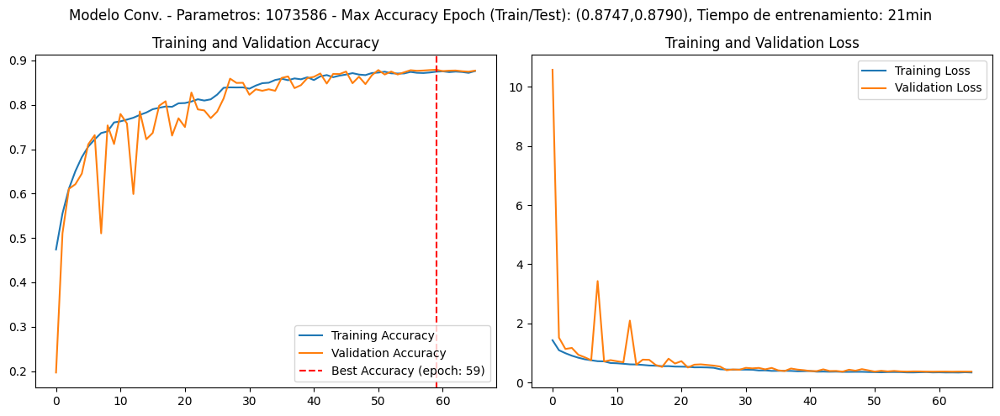

In [ ]:
# Grafica la precisión y pérdida de entrenamiento y validación
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.epoch))
best_acc_epoch = np.argmax(val_acc)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Subplot 1 - Accuracy
axs[0].plot(epochs_range, acc, label='Training Accuracy')
axs[0].plot(epochs_range, val_acc, label='Validation Accuracy')
axs[0].axvline(best_acc_epoch, color='red', linestyle='--', label=f'Best Accuracy (epoch: {np.argmax(val_acc)})')
axs[0].legend(loc='lower right')
axs[0].set_title('Training and Validation Accuracy')

# Subplot 2 - Loss
axs[1].plot(epochs_range, loss, label='Training Loss')
axs[1].plot(epochs_range, val_loss, label='Validation Loss')
axs[1].legend(loc='upper right')
axs[1].set_title('Training and Validation Loss')

# Título general opcional
fig.suptitle(f'Modelo Conv. - Parametros: {num_params} - Max Accuracy Epoch (Train/Test): ({acc[np.argmax(val_acc)]:.4f},{max(val_acc):.4f}), Tiempo de entrenamiento: {training_time/ 60:.0f}min', fontsize=12)

plt.tight_layout()
plt.subplots_adjust(top=0.87)
plt.show()

Se aprecia que el modelo con bloques residuales presenta oscilaciones notablemente mayores durante las primeras épocas que la versión sin bloques residuales.

Al comparar ambas curvas, los picos del modelo residual son más pronunciados, lo cual se explica por el incremento efectivo del gradiente, lo que se traduce en un comportamiento más ruidoso y con oscilaciones más elevadas, sobre todo en las etapas iniciales del entrenamiento.

Las métricas globales se mantuvieron prácticamente sin cambios, lo cual es esperable dado que la arquitectura empleada carece de la profundidad necesaria para sufrir el desvanecimiento de gradientes.

En consecuencia, el comportamiento y las métricas del modelo con bloques residuales resultan prácticamente idénticos a los del modelo convolucional original.

In [ ]:
best_conv_model = load_model('models/best_residual_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


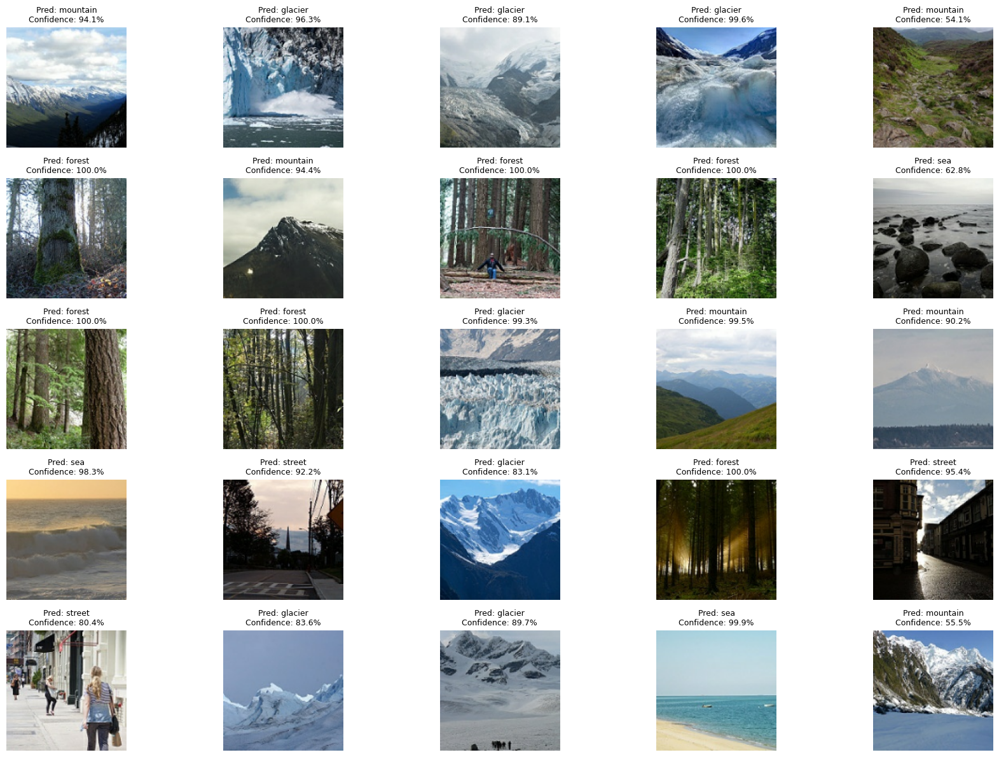

In [ ]:
for images in prediction_ds.take(1):
  prediction_images = images[:25]
  true_labels = images[:25]
  break

predictions = best_conv_model.predict(prediction_images)

# Crear subplots
fig, axes = plt.subplots(5, 5, figsize=(18, 12))

for idx, ax in enumerate(axes.flat):
    img = prediction_images[idx].numpy().astype("uint8")
    pred_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img)
    ax.set_title(f"Pred: {pred_class}\nConfidence: {confidence:.1f}%", fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()

Si bien las métricas generales de rendimiento se mantuvieron prácticamente iguales entre el modelo convolucional original y la variante con bloques residuales, se observó un cambio en los niveles de confianza asignados a las predicciones. Esto indica que, aunque la precisión global no varió significativamente, el modelo procesó y ponderó de forma distinta la información de ciertas clases.

Para las clases street y building, cuyas imágenes incluyen detalles finos, el bloque residual refuerza esos patrones y eleva ligeramente la confianza de clasificación. En cambio, para clases más homogéneas como sea o mountain, la suma de la entrada cruda introduce información redundante que añade ruido al vector de características, provocando mayor fluctuación en la confianza, aunque el modelo continúa prediciendo correctamente en la mayoría de los casos.

## Modelo con transfer learning

In [ ]:
def build_transfer_learning_model(input_shape, num_classes):

    base_model = tf.keras.applications.EfficientNetB0(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = False

    i = Input(shape=input_shape)
    x = preprocess_input(i)
    x = base_model(x, training=False)
    x = GlobalMaxPooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(i, x)

Para el modelo Transfer Learning se empleó EfficientNetB0. A continuación, el GlobalMaxPooling sobre el backbone extrae un vector de 1280 características, el cual se considera suficientemente complejo para discriminar entre clases sin necesidad de capas intermedias.

Si bien se evaluó añadir un head denso con capas de 64, 128 y 256 neuronas, no se observó ninguna mejora en las métricas, por lo que se optó por conectar directamente ese vector a la capa de salida.

In [ ]:
model = build_transfer_learning_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)
model.summary()
num_params = model.count_params()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 4, 4, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d_3          │ (None, 1280)           │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 6)              │         7,686 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,057,257 (15.48 MB)

 Trainable params: 7,686 (30.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "best_transfer_learning_model.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.6,
    mode="max",
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss", factor=0.5, patience=4, verbose=0, min_delta=1e-4, mode="min", min_lr=1e-6)

model.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])


start_time = time.time()

# Número de épocas de entrenamiento
EPOCHS = 10
# Entrena el modelo
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping, reduce_lr]
)

end_time = time.time()
training_time = end_time - start_time

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - accuracy: 0.7199 - loss: 0.8516 - val_accuracy: 0.8873 - val_loss: 0.3094 - learning_rate: 0.0010
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - accuracy: 0.8965 - loss: 0.2792 - val_accuracy: 0.9003 - val_loss: 0.2825 - learning_rate: 0.0010
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.9112 - loss: 0.2426 - val_accuracy: 0.8940 - val_loss: 0.2982 - learning_rate: 0.0010
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.9213 - loss: 0.2107 - val_accuracy: 0.9053 - val_loss: 0.2690 - learning_rate: 0.0010
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.9294 - loss: 0.1918 - val_accuracy: 0.9030 - val_loss: 0.2872 - learning_rate: 0.0010
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.9302 - loss: 0.1843 - val_accuracy: 0.8990 - val_loss: 0.2976 - learning_rate: 0.0010
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.9300 - 

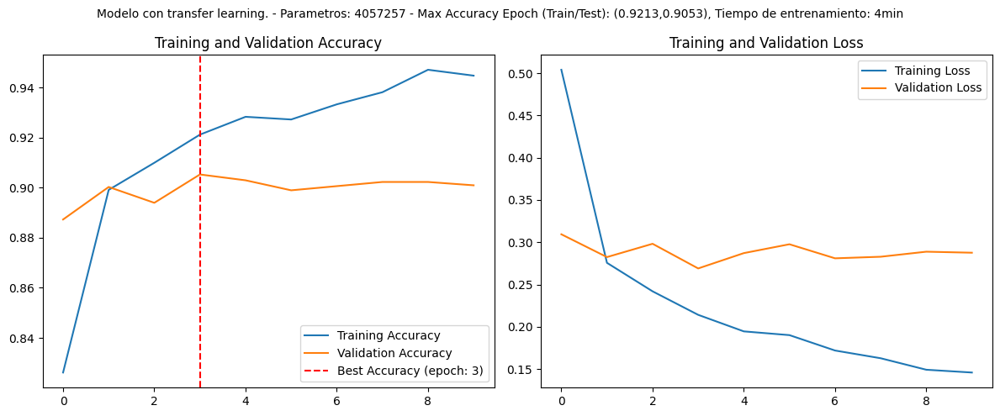

In [ ]:
# Grafica la precisión y pérdida de entrenamiento y validación
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.epoch))
best_acc_epoch = np.argmax(val_acc)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Subplot 1 - Accuracy
axs[0].plot(epochs_range, acc, label='Training Accuracy')
axs[0].plot(epochs_range, val_acc, label='Validation Accuracy')
axs[0].axvline(best_acc_epoch, color='red', linestyle='--', label=f'Best Accuracy (epoch: {np.argmax(val_acc)})')
axs[0].legend(loc='lower right')
axs[0].set_title('Training and Validation Accuracy')

# Subplot 2 - Loss
axs[1].plot(epochs_range, loss, label='Training Loss')
axs[1].plot(epochs_range, val_loss, label='Validation Loss')
axs[1].legend(loc='upper right')
axs[1].set_title('Training and Validation Loss')

# Título general opcional
fig.suptitle(f'Modelo con transfer learning. - Parametros: {num_params} - Max Accuracy Epoch (Train/Test): ({acc[np.argmax(val_acc)]:.4f},{max(val_acc):.4f}), Tiempo de entrenamiento: {training_time/ 60:.0f}min', fontsize=10)

plt.tight_layout()
plt.subplots_adjust(top=0.87)
plt.show()

Se entrenó el modelo durante más épocas (50–60), pero no se observó una mejora significativa en la precisión de validación una vez superadas las primeras 15 épocas. Por esta razón, se optó por entrenarlo únicamente durante 10 épocas.

Aunque prolongar el entrenamiento podría incrementar la accuracy de validación hasta un 0,91, la accuracy en entrenamiento alcanza el 0,99, lo que evidencia una tendencia al overfitting.

Por ello, conviene evaluar si el ligero aumento en validación justifica la mayor brecha entre entrenamiento y validación.

In [ ]:
best_conv_model = load_model('models/best_transfer_learning_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


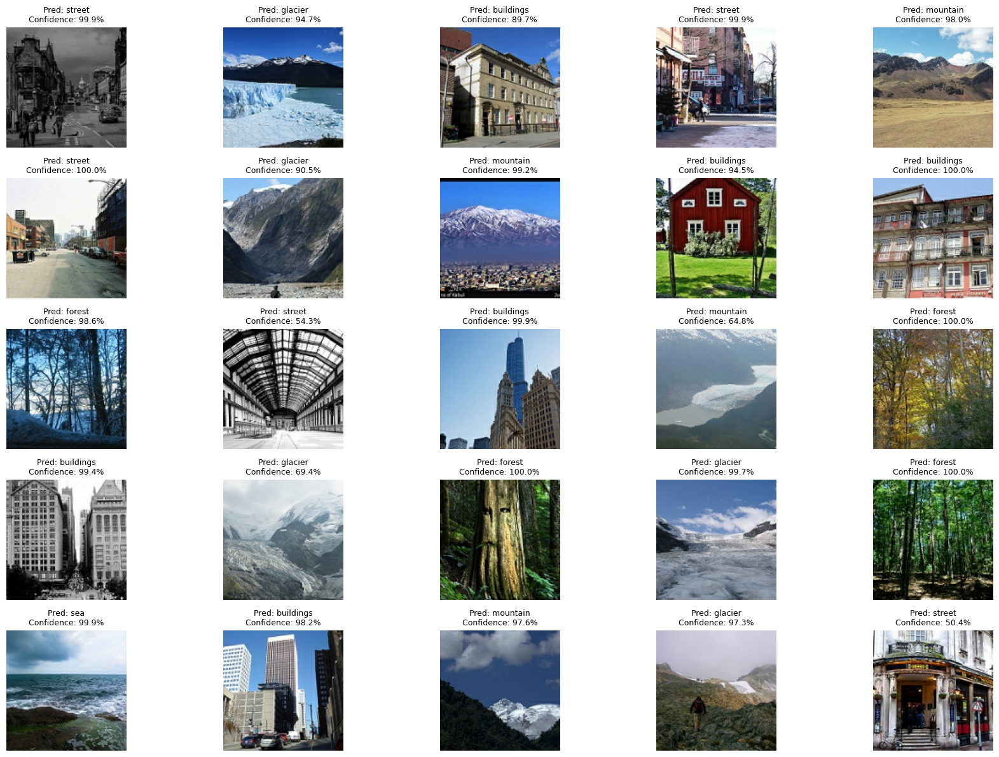

In [ ]:
for images in prediction_ds.take(1):
  prediction_images = images[:25]
  true_labels = images[:25]
  break

predictions = best_conv_model.predict(prediction_images)

# Crear subplots
fig, axes = plt.subplots(5, 5, figsize=(18, 12))

for idx, ax in enumerate(axes.flat):
    img = prediction_images[idx].numpy().astype("uint8")
    pred_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img)
    ax.set_title(f"Pred: {pred_class}\nConfidence: {confidence:.1f}%", fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()

Se observa un rendimiento global muy sólido, con la mayoría de las categorías clasificadas con elevada confianza.

Sin embargo, algunas clases presentan niveles de certeza más bajos; por ejemplo, una muestra de street alcanzó apenas un 54 % de confianza. Esto apunta a que ciertas categorías difíciles de distinguir (como escenas con ríos entre montañas o imágenes etiquetadas de forma ambigua como glacier en lugar de mountain) podrían beneficiarse de una revisión y posible refinamiento del dataset para garantizar que las muestras sean realmente representativas.

A pesar de estos casos puntuales, el modelo mantiene un desempeño excelente en términos generales, aunque conviene analizar la calidad y diversidad de las clases con menor confianza.

## Conclusiones

El modelo basado en capas densas presenta limitaciones conocidas que motivaron la creación de arquitecturas convolucionales, por lo que no fue considerado competitivo frente a las otras variantes. Por otro lado, el modelo con bloque residual no mostró mejoras significativas en esta arquitectura, ya que la red no es lo suficientemente profunda como para beneficiarse del mecanismo residual.

En cuanto a la comparación entre el modelo convolucional entrenado desde cero y el modelo con Transfer Learning (EfficientNetB0), ambos alcanzaron métricas similares, (0.88/0.90) en validación.

No obstante, mientras el modelo convolucional utiliza aproximadamente 1 millón de parámetros, el modelo basado en Transfer Learning emplea cerca de 4 millones. Esta diferencia de complejidad no se traduce en una brecha significativa en rendimiento, pero sí en la elección del entorno más adecuado para cada uno.

Si el objetivo es desplegar el modelo en un entorno con recursos computacionales amplios, como un servidor en la nube, el modelo con Transfer Learning resulta preferible por su mejor rendimiento y mayor confianza en las predicciones.

En cambio, si se busca correr el modelo en dispositivos con recursos limitados (como aplicaciones móviles, o hardware de bajo consumo), la alternativa convolucional puede ser más adecuada gracias a su menor tamaño y menor demanda computacional.